# CellNet
## Overfit on 1 image

In [1]:
import ast
from math import prod
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import os

import torch

import albumentations as A
from albumentations.pytorch import ToTensorV2

from types import SimpleNamespace as obj

import util.data as data
import util.plot as plot

CUDA = torch.cuda.is_available()
device = torch.device('cuda:0' if CUDA else 'cpu'); print('device =', device)

DRAFT = False if os.getenv('BATCHED_RUN', '0')=='1' else True
if DRAFT: plot.set_zoom(0.5)

def gpu(x, device=device): return torch.from_numpy(x).float().to(device)
def cpu(x): return x.detach().cpu().numpy() if isinstance(x, torch.Tensor) else x

key2text = {'tl': 'Training Loss',     'vl': 'Validation Loss', 
            'ta': 'Training Accuracy', 'va': 'Validation Accuracy', 
            'ti': 'Training Image',    'vi': 'Validation Image',
            'lf': 'Loss Function',
            's' : 'Artificial Sparsity',
            'f' : 'Fraction of Data',  
            'e' : 'Epoch', 'lr': 'Learning Rate' }

cfg = obj(
  sigma = 3.5,  # TODO LATER: grid search for optimum 
  maxdist = 26, # TODO LATER: grid search for optimum (thats for the sparsity map)
  cropsize = 256,
  label2int = lambda l:{'Live Cell':1, 'Dead cell/debris':2}[l], 
  CUDA = CUDA, DRAFT = DRAFT
)

device = cuda:0


In [2]:
def mkAugs(mode):
  T = lambda ts:  A.Compose(transforms=[
    A.PadIfNeeded(cfg.cropsize*2, cfg.cropsize*2, border_mode=0, value=0),
    *ts,
    XNorm(), 
    ToTensorV2(transpose_mask=True, always_apply=True)], 
    keypoint_params=A.KeypointParams(format='xy', label_fields=['class_labels'], remove_invisible=True)
  )

  vals = [A.D4(),
          ]

  return dict(
    test  = T([]),
    val   = T([A.RandomCrop(cfg.cropsize, cfg.cropsize, p=1),
               *vals]),
    train = T([A.RandomSizedCrop(p=1, min_max_height=(cfg.cropsize//2, cfg.cropsize*2), 
                                 height=cfg.cropsize, width=cfg.cropsize),
               A.Rotate(),
               A.AdvancedBlur(),
               A.Equalize(),
               A.ColorJitter(), 
               A.GaussNoise(),
               *vals])
  )[mode]


XNorm, keypoints2heatmap, yunnorm = data.mk_norms([1,2,4], cfg)

trainaugs = mkAugs('train')
valaugs = mkAugs('val')
testaugs = mkAugs('test')

/gpfs/space/home/eckhardt/.micromamba/envs/cellnet/lib/python3.12/site-packages/IPython/core/events.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  func(*args, **kwargs)


/gpfs/space/home/eckhardt/.micromamba/envs/cellnet/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


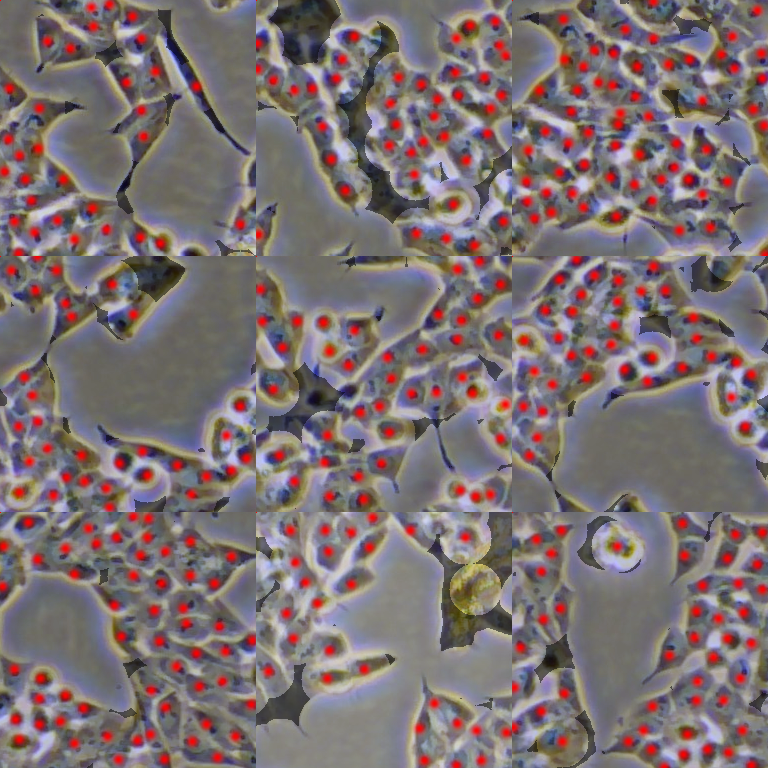

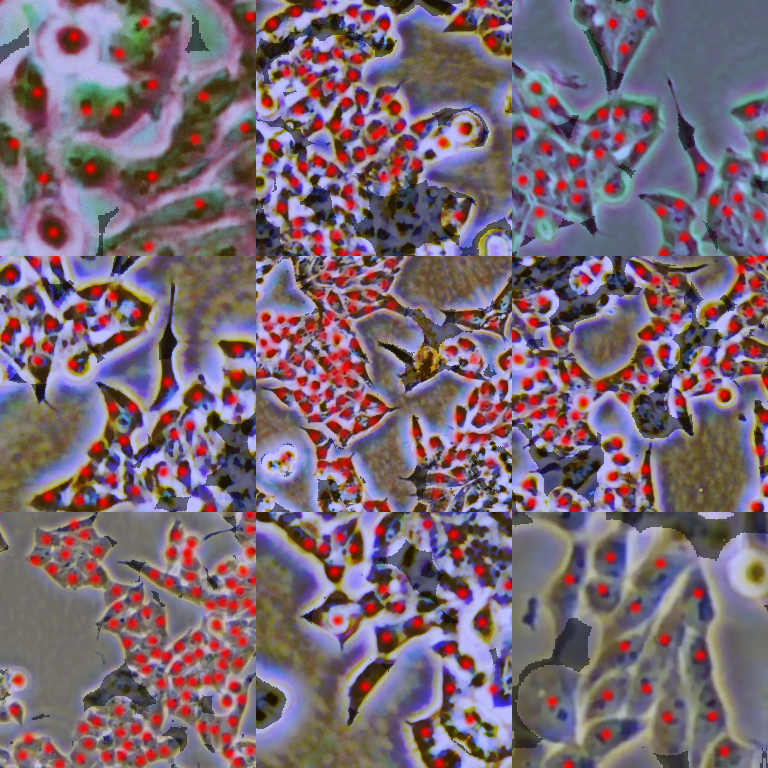

In [3]:

def plot_overlay(x,m,z, ax=None):
  ax = plot.image(x, ax=ax)
  plot.heatmap(1-m, ax=ax, alpha=lambda x: 0.5*x, color='#000000')
  plot.heatmap(  z, ax=ax, alpha=lambda x: 1.0*x, color='#ff0000')
  return ax

def plot_grid(grid, **loader_kwargs):
  loader = data.mk_loader([1], cfg=cfg, bs=prod(grid), **loader_kwargs)
  B = next(iter(loader))
  B = zip(B['image'], B['masks'][0], keypoints2heatmap(B))
  for b,ax in zip(B, plot.grid(grid, [cfg.cropsize]*2)[1]):
    plot_overlay(*[cpu(v) for v in b], ax=ax)

#for B in data.mk_loader([1,2,4], cfg=cfg, bs=1, transforms=testaugs, shuffle=False):
# plot_overlay(*[cpu(v[0]) for v in [B['image'], B['masks'][0], keypoints2heatmap(B)]])

plot_grid((3,3), transforms=valaugs)
plot_grid((3,3), transforms=trainaugs)

In [4]:
import segmentation_models_pytorch as smp
plt.close('all')

mk_model = lambda: smp.Unet(  # NOTE TODO: check if spefically used model automatically mirror pads in training or inference
    encoder_name="resnet152",  # 18 34 50 101 152
    encoder_weights=None,
    in_channels=3,
    classes=1,
    activation='sigmoid',
  ).to(device)  
mk_model()

/gpfs/space/home/eckhardt/.micromamba/envs/cellnet/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Unet(
  (encoder): ResNetEncoder(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
      

/gpfs/space/home/eckhardt/.micromamba/envs/cellnet/lib/python3.12/site-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at /opt/conda/conda-bld/pytorch_1712608847532/work/aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,


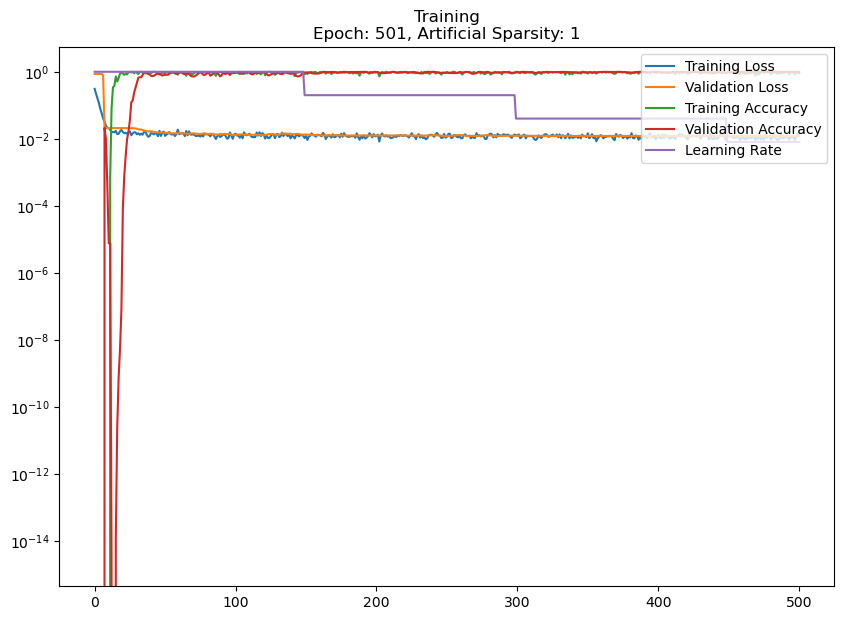

In [5]:

# TODO: apply MESA loss from @lempitsky2010learning.  Other losses: research follow-up literature. (xie2016microscopy uses L2 loss)
def lossf(y, z, m, count=False):
  y *= m; z *= m  # mask 
  SE = (y - z)**2 
  MSE = SE.mean()
  C = (y.sum() - z.sum()) / z.sum()   # TODO opt-in count loss, later in training? normalize with respect to MSE? because rn it seems to disturb training?
  return MSE# + (C if count else 0)

def accuracy(y,z, return_counts=False):
  ny = yunnorm(y).sum().item()
  nz = yunnorm(z).sum().item()
  a = 1 - abs(ny - nz) / nz
  if return_counts: return ny, nz, a
  else: return a

def train(epochs, model, traindl, valdl=None, plot_live = DRAFT, info={}):
  lr0 = 5e-3
  optim = torch.optim.Adam(model.parameters(), lr=lr0)
  lossf = torch.nn.MSELoss()  # REVERT?
  sched = torch.optim.lr_scheduler.StepLR(optim, step_size=150, gamma=0.2)

  log = pd.DataFrame(columns='tl vl ta va lr'.split(' '), index=range(epochs))
  for e in range(epochs):
    model.train()

    l = 0; a = 0; b = 0
    for b, B in enumerate(traindl):
      x,m = B['image'].to(device), B['masks'][0].to(device)
      z = keypoints2heatmap(B).to(device)

      y = model(x)
      loss = lossf(y*m, z*m) 
      loss.backward()
      
      optim.step()
      optim.zero_grad()

      l += loss.item()
      a += accuracy(y*m, z*m) # type: ignore

    sched.step() 

    lg = log.loc[e] 
    lg['tl'] = l/(b+1)
    lg['ta'] = a/(b+1)
    lg['lr'] = optim.param_groups[0]['lr']/lr0

    if valdl is not None:
      model.eval()
      with torch.no_grad():
        l = 0; a = 0
        for b, B in enumerate(valdl):
          x,m = B['image'].to(device), B['masks'][0].to(device)
          z = keypoints2heatmap(B).to(device)

          y = model(x)

          l += lossf(y*m, z*m).item()  
          a += accuracy(y*m, z*m) # type: ignore
        
        lg['vl'] = l/(b+1)
        lg['va'] = a/(b+1)

    if plot_live: plot.train_graph(e, log, info=info, key2text=key2text, clear=True)
  plot.train_graph(epochs, log, info=info, key2text=key2text) 
  
  return log


splits_main = [([2,4], [1]), ([1,4], [2]), ([1,2], [4])]
splits_one = [([1], [1])]
splits = splits_one

ps = [(x, x) for x in [1]] #[0.1, 0.3, 0.5, 0.7, 0.9, 0.95, 1]]  
P = 's'  # 'f'

results = pd.DataFrame(columns=[P, 'ti', 'vi', 'ta', 'va', 'tl', 'vl', 'ty', 'vy'])

for _p, p in ps:
  for ti, vi in splits:
    traindl = data.mk_loader(ti, bs=8, transforms=valaugs, sparsity=p, cfg=cfg)  # REVERT: transforms=trainaugs
    valdl   = data.mk_loader(vi, bs=1, transforms=testaugs, cfg=cfg)  # REVERT: transforms=valaugs

    model = mk_model()
    log = train(501 if not DRAFT else 2, model, traindl, valdl, info={P: _p})

    model.eval()
    with torch.no_grad():
      # save predictions instead of model, because more compact. use different logic to save best model to disk
      ty, vy = [[cpu(model(next(iter(data.mk_loader([i], bs=1, transforms=testaugs, shuffle=False, cfg=cfg)))
                       ['image'].to(device))) for i in ids] for ids in [ti, vi]]

    _row =  pd.DataFrame(dict(**log.iloc[-1], ti=[ti], vi=[vi], ty=[ty], vy=[vy], **{P: [_p]}))
    results = _row if results.empty else pd.concat([results, _row], ignore_index=True)

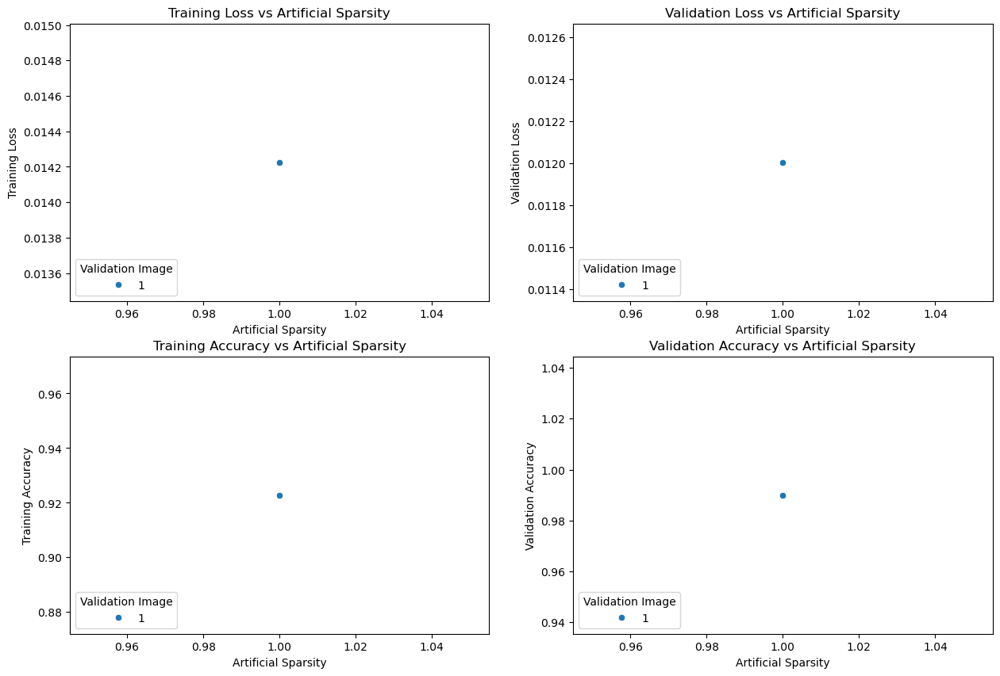

In [6]:
results.drop(columns=['ty', 'vy']).to_csv('results.csv', index=False, sep=';')
R = pd.read_csv('results.csv', sep=';', converters=dict(ti=ast.literal_eval, vi=ast.literal_eval)).rename(columns=dict(vi=key2text['vi']))
plot.regplot(R, P, key2text)

/gpfs/space/home/eckhardt/.micromamba/envs/cellnet/lib/python3.12/site-packages/IPython/core/events.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  func(*args, **kwargs)


/gpfs/space/home/eckhardt/.micromamba/envs/cellnet/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


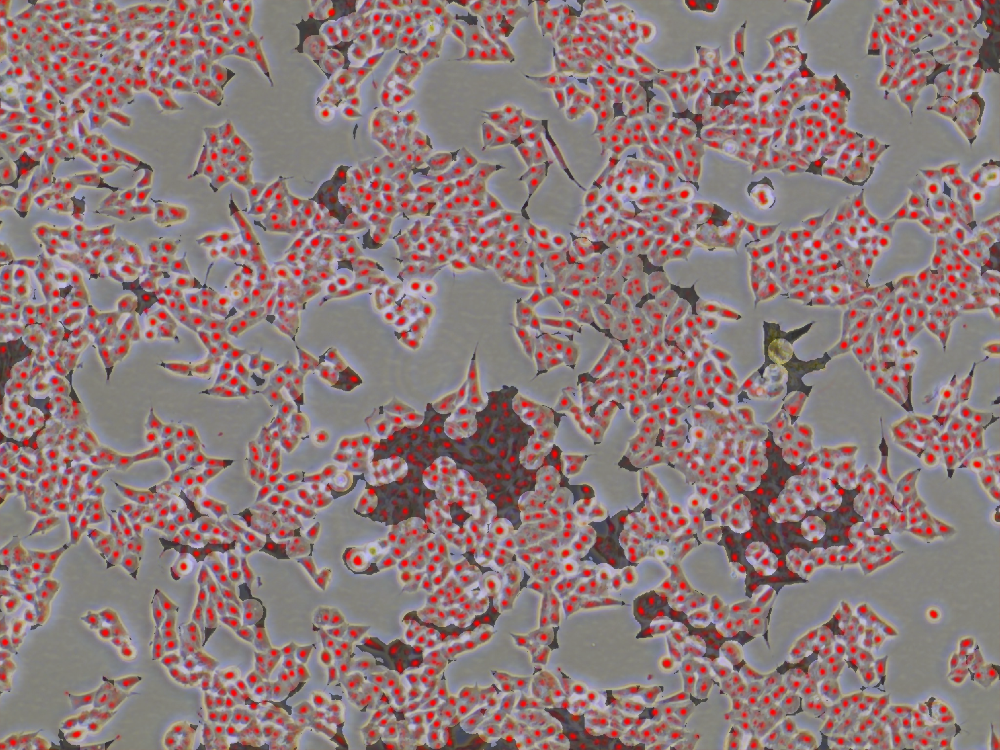

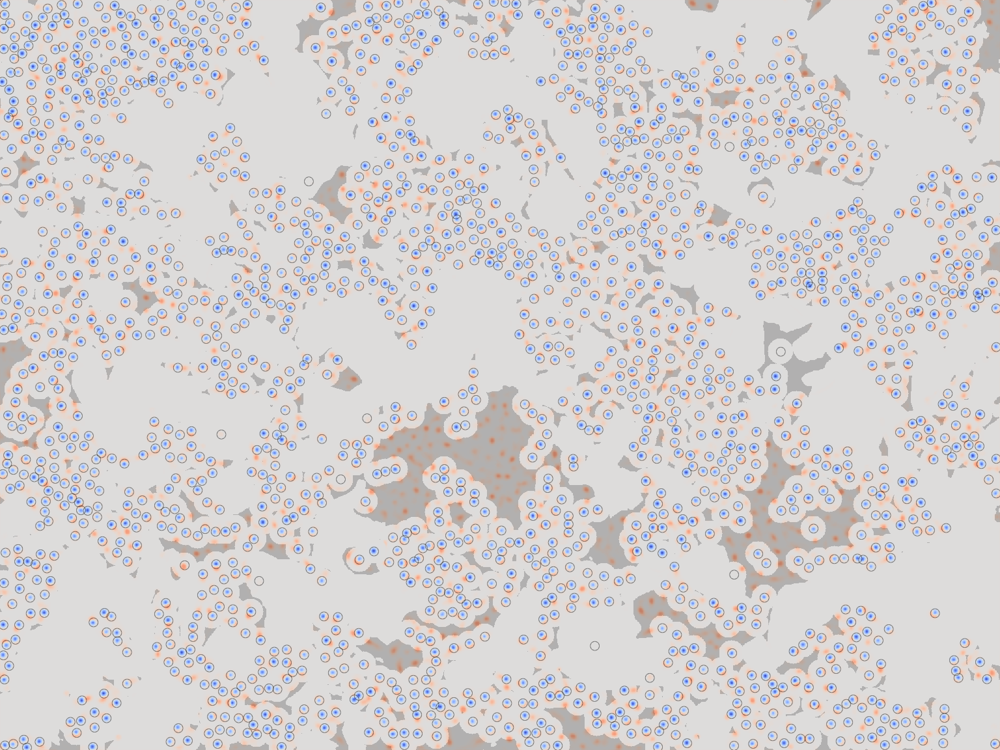

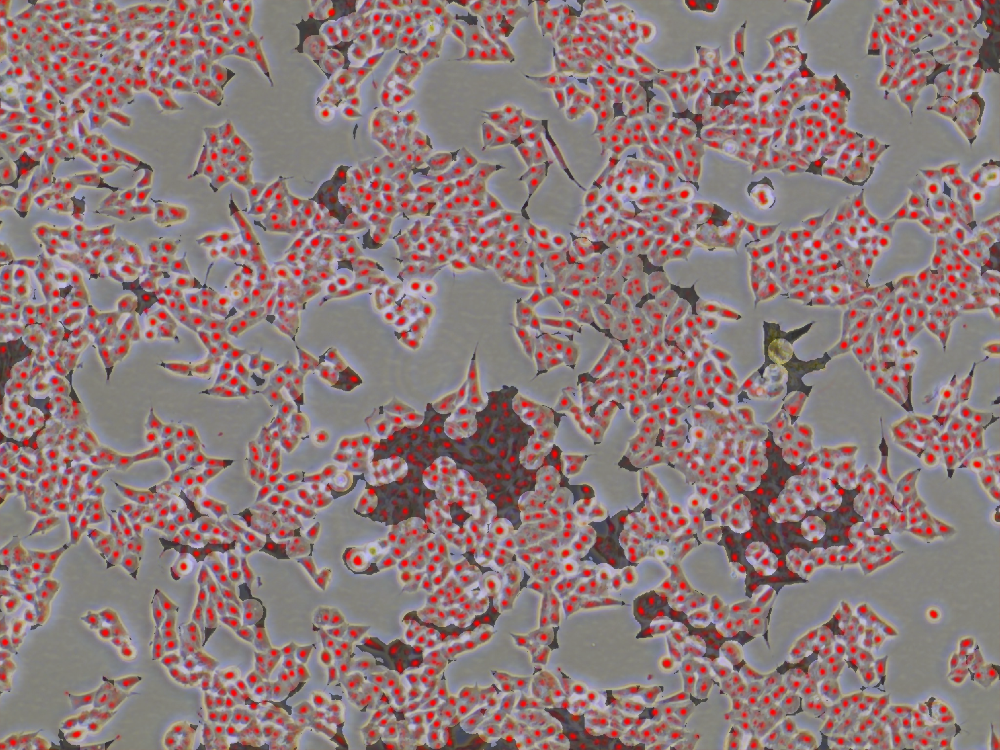

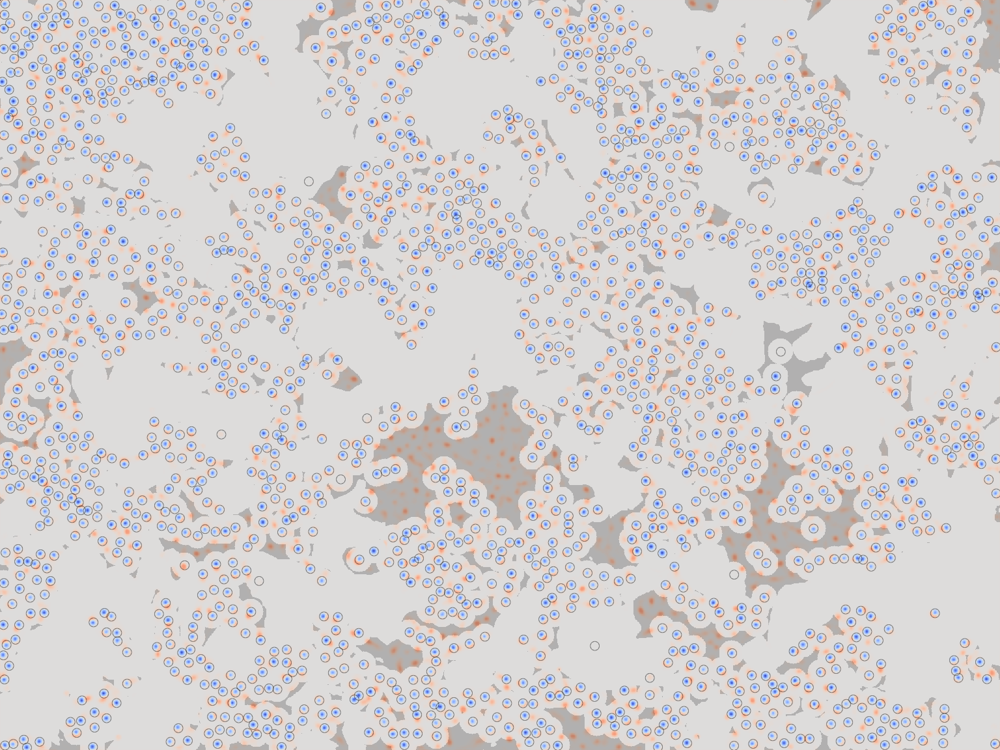

In [7]:
def plot_diff(x,m,y,z,k, ax=None):
  title = f"Difference between Target and Predicted Heatmap"
  D = y-z; D[0, 1,0] = -1; D[0, 1,1] = 1 
  ax = plot.image(D, ax=ax, cmap='coolwarm')
  plot.heatmap(1-m, ax=ax, alpha=lambda x: 0.2*x, color='#000000')
  plot.points(ax, k, cfg.sigma)
  return ax

for _,r in results.iterrows():
  for _i, _y in [('vi', 'vy'), ('ti', 'ty')]:
    for i, y in zip(r[_i], r[_y]):
      y = y[0]
      B = next(iter(data.mk_loader([i], bs=1, transforms=testaugs, shuffle=False, cfg=cfg)))
      x,m,z,k = [cpu(v[0]) for v in [B['image'], B['masks'][0], keypoints2heatmap(B), B['keypoints']]]
      
      plot_overlay(x,m,y)
      plot_diff(x,m,y,z,k)

In [8]:
plt.close('all')